## 1) Prepare a classification model using SVM for salary data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
train=pd.read_csv('/content/SalaryData_Train(1).csv')
train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [3]:
test=pd.read_csv('/content/SalaryData_Test(1).csv')

In [4]:
test.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K


EDA for train Data

In [5]:
train.shape

(30161, 14)

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30161 entries, 0 to 30160
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            30161 non-null  int64 
 1   workclass      30161 non-null  object
 2   education      30161 non-null  object
 3   educationno    30161 non-null  int64 
 4   maritalstatus  30161 non-null  object
 5   occupation     30161 non-null  object
 6   relationship   30161 non-null  object
 7   race           30161 non-null  object
 8   sex            30161 non-null  object
 9   capitalgain    30161 non-null  int64 
 10  capitalloss    30161 non-null  int64 
 11  hoursperweek   30161 non-null  int64 
 12  native         30161 non-null  object
 13  Salary         30161 non-null  object
dtypes: int64(5), object(9)
memory usage: 3.2+ MB


In [7]:
train.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [8]:
from sklearn.preprocessing import LabelEncoder

In [9]:
le=LabelEncoder()

In [10]:
train['workclass']=le.fit_transform(train['workclass'])
train['education']=le.fit_transform(train['education'])
train['maritalstatus']=le.fit_transform(train['maritalstatus'])
train['occupation']=le.fit_transform(train['occupation'])
train['relationship']=le.fit_transform(train['relationship'])
train['race']=le.fit_transform(train['race'])
train['sex']=le.fit_transform(train['sex'])
train['native']=le.fit_transform(train['native'])
train['Salary']=le.fit_transform(train['Salary'])

In [11]:
train.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174,0,40,37,0
1,50,4,9,13,2,3,0,4,1,0,0,13,37,0
2,38,2,11,9,0,5,1,4,1,0,0,40,37,0
3,53,2,1,7,2,5,0,2,1,0,0,40,37,0
4,28,2,9,13,2,9,5,2,0,0,0,40,4,0


In [12]:
train.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
30156    False
30157     True
30158    False
30159     True
30160    False
Length: 30161, dtype: bool

In [13]:
train[train.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
326,33,2,9,13,2,3,0,4,1,0,0,40,37,1
364,27,2,9,13,4,2,1,4,1,0,0,50,37,0
518,24,2,11,9,4,5,4,2,0,0,0,40,37,0
525,24,2,11,9,4,2,3,4,1,0,0,40,37,0
619,33,2,9,13,2,3,0,4,1,0,0,40,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30110,47,2,11,9,2,2,0,4,1,0,0,40,37,0
30118,20,2,11,9,4,6,3,4,1,0,0,40,37,0
30132,22,2,15,10,4,0,3,4,1,0,0,40,37,0
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,1


In [14]:
train.drop_duplicates(inplace=True)
train.reset_index(drop=True,inplace=True)
train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174,0,40,37,0
1,50,4,9,13,2,3,0,4,1,0,0,13,37,0
2,38,2,11,9,0,5,1,4,1,0,0,40,37,0
3,53,2,1,7,2,5,0,2,1,0,0,40,37,0
4,28,2,9,13,2,9,5,2,0,0,0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,53,2,12,14,2,3,0,4,1,0,0,40,37,1
26899,22,2,15,10,4,10,1,4,1,0,0,40,37,0
26900,27,2,7,12,2,12,5,4,0,0,0,38,37,0
26901,58,2,11,9,6,0,4,4,0,0,0,40,37,0


In [15]:
train.isnull()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,False,False,False,False,False,False,False,False,False,False,False,False,False,False
26899,False,False,False,False,False,False,False,False,False,False,False,False,False,False
26900,False,False,False,False,False,False,False,False,False,False,False,False,False,False
26901,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [16]:
train.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

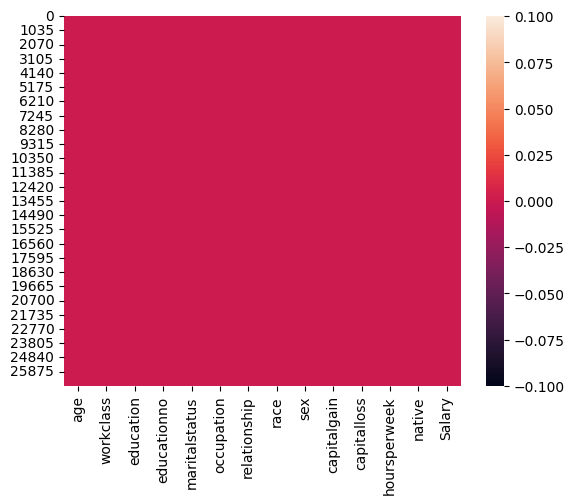

In [17]:
sns.heatmap(train.isnull())
plt.show()

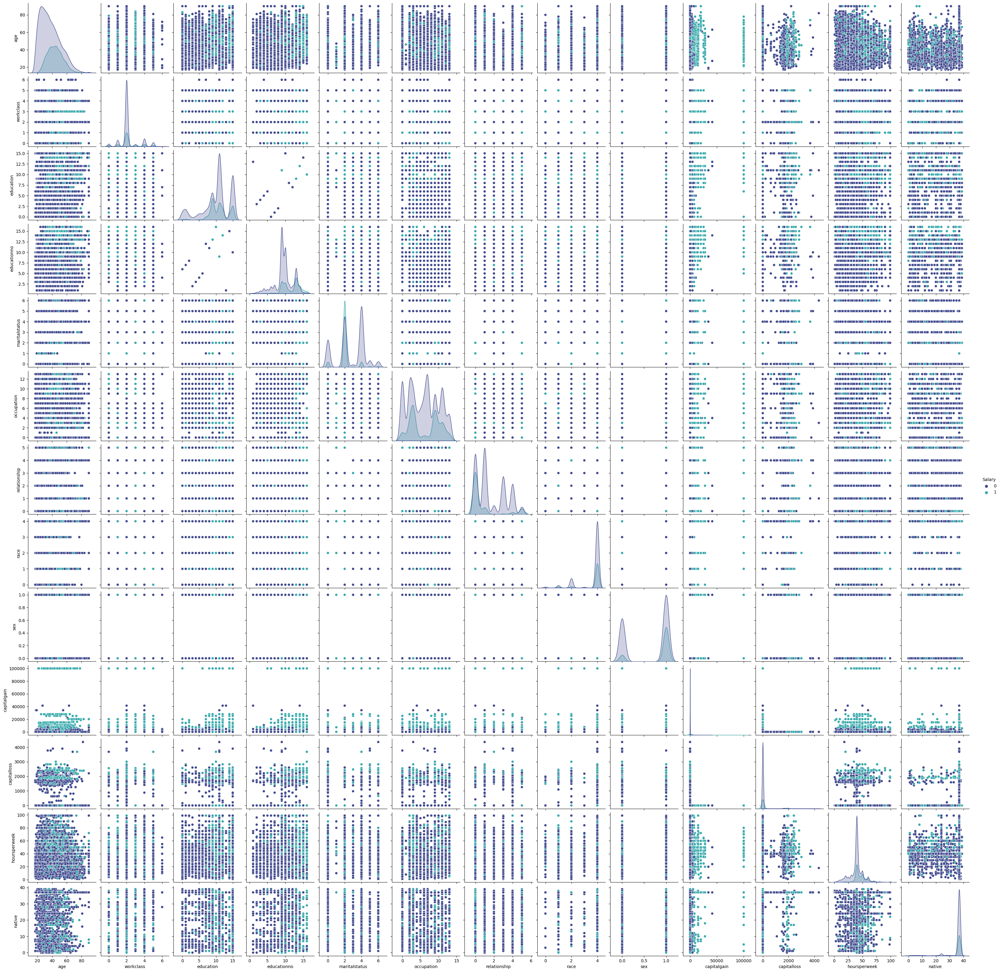

In [18]:
sns.pairplot(train,palette='mako',hue='Salary')
plt.show()

In [19]:
train.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.075184,0.002717,0.038048,-0.245062,-0.004570,-0.231111,0.040457,0.070434,0.077235,0.052684,0.072529,0.010626,0.223502
workclass,0.075184,1.000000,0.021289,0.037806,-0.031961,0.014047,-0.070996,0.051479,0.079380,0.033217,0.002739,0.047169,0.012683,0.016577
education,0.002717,0.021289,1.000000,0.359940,-0.040931,-0.025890,-0.010801,0.005572,-0.029841,0.034550,0.020469,0.058709,0.076605,0.090094
educationno,0.038048,0.037806,0.359940,1.000000,-0.066536,0.084300,-0.092236,0.035215,0.010941,0.126085,0.080025,0.145491,0.096279,0.332178
maritalstatus,-0.245062,-0.031961,-0.040931,-0.066536,1.000000,0.015094,0.155553,-0.073628,-0.108928,-0.042087,-0.033890,-0.175692,-0.029585,-0.184559
occupation,-0.004570,0.014047,-0.025890,0.084300,0.015094,1.000000,-0.063950,0.008183,0.066919,0.019724,0.010873,0.023073,0.003024,0.050711
relationship,-0.231111,-0.070996,-0.010801,-0.092236,0.155553,-0.063950,1.000000,-0.113708,-0.586804,-0.063322,-0.070351,-0.248745,-0.006126,-0.247438
race,0.040457,0.051479,0.005572,0.035215,-0.073628,0.008183,-0.113708,1.000000,0.085786,0.020049,0.032111,0.056460,0.118907,0.079109
sex,0.070434,0.079380,-0.029841,0.010941,-0.108928,0.066919,-0.586804,0.085786,1.000000,0.053490,0.053084,0.228767,-0.004930,0.217360
capitalgain,0.077235,0.033217,0.034550,0.126085,-0.042087,0.019724,-0.063322,0.020049,0.053490,1.000000,-0.036023,0.079403,0.012902,0.228865


[]

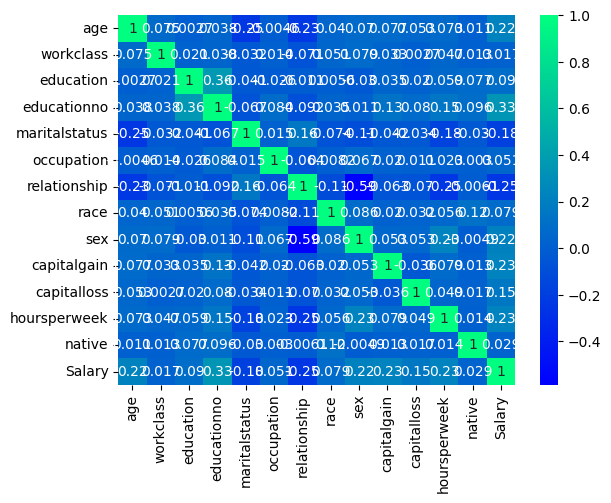

In [20]:
sns.heatmap(train.corr(),cmap='winter',annot=True)
plt.plot()

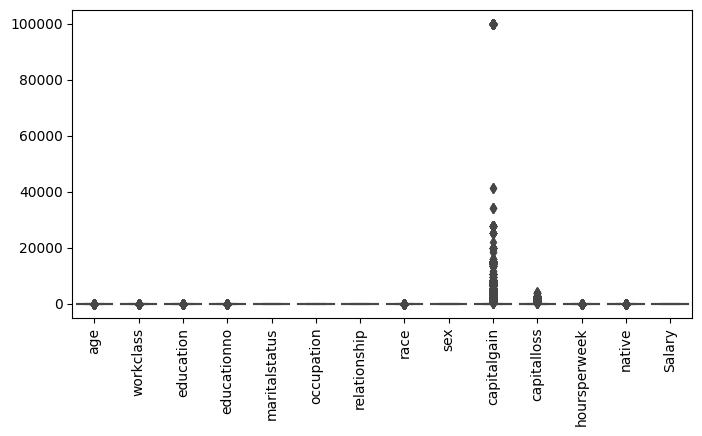

In [21]:
plt.figure(figsize=(8,4))
sns.boxplot(data=train)
plt.xticks(rotation=90)
plt.show()

In [22]:
from sklearn.preprocessing import MinMaxScaler

In [23]:
scaler=MinMaxScaler()

In [24]:
train['capitalgain']=scaler.fit_transform(train['capitalgain'].values.reshape(-1,1))

In [25]:
train['capitalloss']=scaler.fit_transform(train['capitalloss'].values.reshape(-1,1))

In [26]:
train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,0.021740,0.0,40,37,0
1,50,4,9,13,2,3,0,4,1,0.000000,0.0,13,37,0
2,38,2,11,9,0,5,1,4,1,0.000000,0.0,40,37,0
3,53,2,1,7,2,5,0,2,1,0.000000,0.0,40,37,0
4,28,2,9,13,2,9,5,2,0,0.000000,0.0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,53,2,12,14,2,3,0,4,1,0.000000,0.0,40,37,1
26899,22,2,15,10,4,10,1,4,1,0.000000,0.0,40,37,0
26900,27,2,7,12,2,12,5,4,0,0.000000,0.0,38,37,0
26901,58,2,11,9,6,0,4,4,0,0.000000,0.0,40,37,0


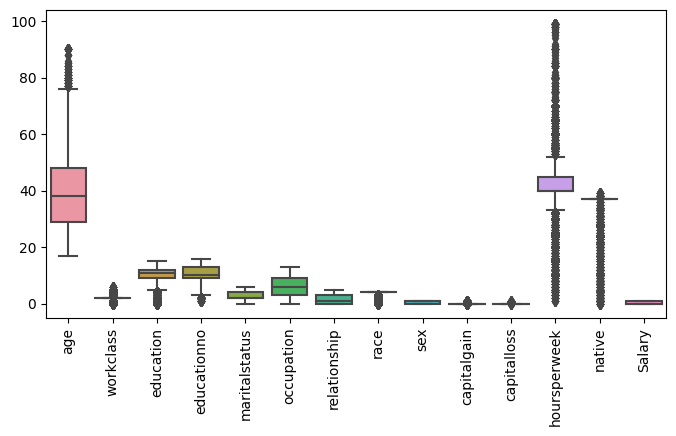

In [27]:
plt.figure(figsize=(8,4))
sns.boxplot(data=train)
plt.xticks(rotation=90)
plt.show()

EDA for Test Data

In [31]:
test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [28]:
test.shape

(15060, 14)

In [29]:
test.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [30]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15060 entries, 0 to 15059
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            15060 non-null  int64 
 1   workclass      15060 non-null  object
 2   education      15060 non-null  object
 3   educationno    15060 non-null  int64 
 4   maritalstatus  15060 non-null  object
 5   occupation     15060 non-null  object
 6   relationship   15060 non-null  object
 7   race           15060 non-null  object
 8   sex            15060 non-null  object
 9   capitalgain    15060 non-null  int64 
 10  capitalloss    15060 non-null  int64 
 11  hoursperweek   15060 non-null  int64 
 12  native         15060 non-null  object
 13  Salary         15060 non-null  object
dtypes: int64(5), object(9)
memory usage: 1.6+ MB


In [32]:
test['workclass']=le.fit_transform(test['workclass'])
test['education']=le.fit_transform(test['education'])
test['maritalstatus']=le.fit_transform(test['maritalstatus'])
test['occupation']=le.fit_transform(test['occupation'])
test['relationship']=le.fit_transform(test['relationship'])
test['race']=le.fit_transform(test['race'])
test['sex']=le.fit_transform(test['sex'])
test['native']=le.fit_transform(test['native'])
test['Salary']=le.fit_transform(test['Salary'])

In [33]:
test.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0


In [34]:
test.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
15055    False
15056    False
15057    False
15058    False
15059    False
Length: 15060, dtype: bool

In [36]:
test[test.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
551,59,2,11,9,0,7,1,4,0,0,0,40,37,0
601,32,2,11,9,2,11,0,4,1,0,0,40,37,0
681,40,2,11,9,2,2,0,4,1,0,0,40,37,0
799,24,2,9,13,4,9,1,4,1,0,0,35,37,0
1044,44,2,14,15,2,9,0,4,1,99999,0,60,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15043,51,2,11,9,2,2,0,4,1,0,0,40,37,0
15044,22,2,15,10,4,2,3,4,1,0,0,40,37,0
15049,32,2,11,9,2,5,0,4,1,0,0,40,37,0
15052,31,2,11,9,2,2,0,4,1,0,0,40,37,0


In [39]:
test.drop_duplicates(inplace=True)
test.reset_index(drop=True,inplace=True)


In [40]:
test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,33,2,9,13,4,9,3,4,1,0,0,40,37,0
14126,39,2,9,13,0,9,1,4,0,0,0,36,37,0
14127,38,2,9,13,2,9,0,4,1,0,0,50,37,0
14128,44,2,9,13,0,0,3,1,1,5455,0,40,37,0


In [41]:
test.isnull()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14126,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14127,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14128,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [42]:
test.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

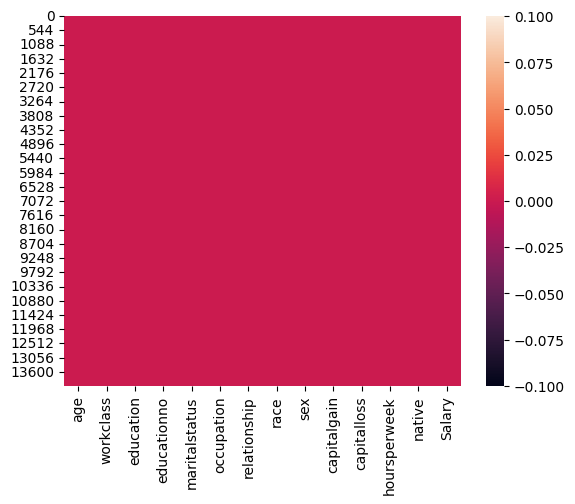

In [43]:
sns.heatmap(test.isnull())
plt.show()

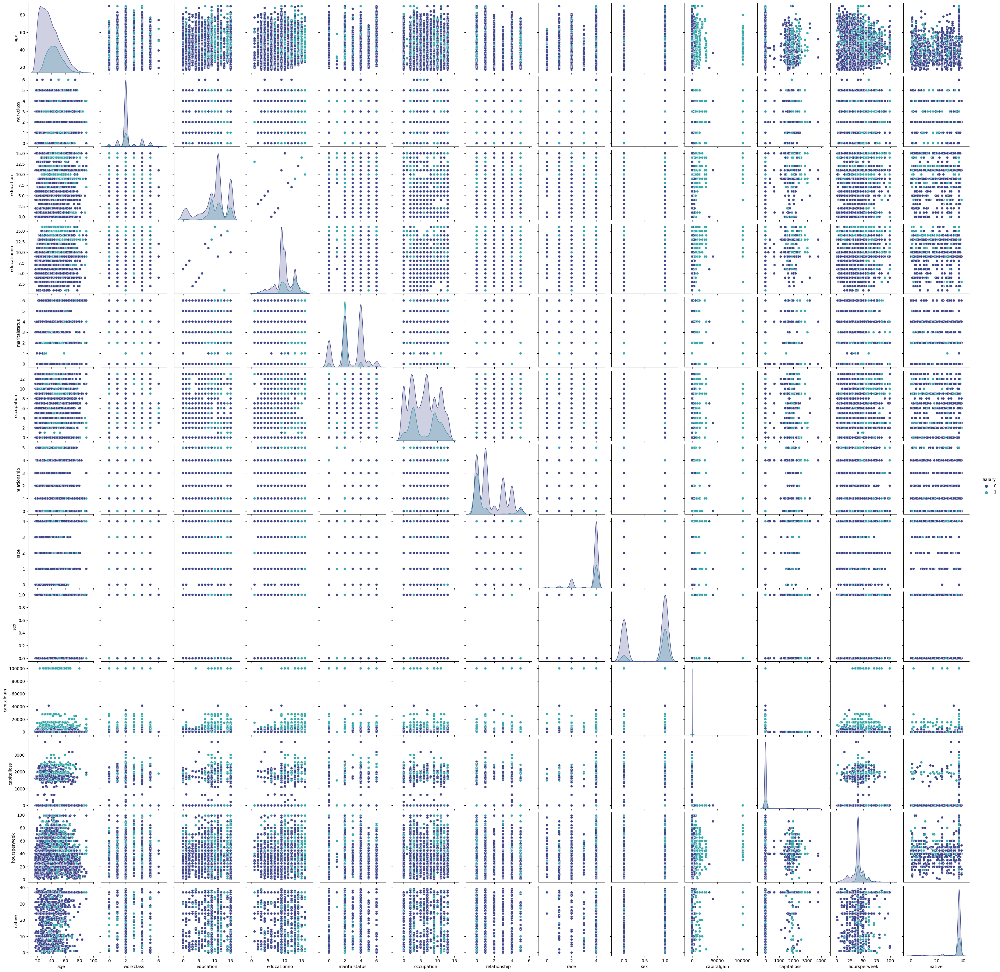

In [44]:
sns.pairplot(data=test,palette='mako',hue='Salary')
plt.show()

In [45]:
test.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.092686,-0.004167,0.021979,-0.245822,-0.003881,-0.241180,0.035180,0.075150,0.076765,0.053172,0.088090,0.001787,0.216703
workclass,0.092686,1.000000,0.021149,0.047708,-0.030821,0.020147,-0.063257,0.064707,0.062290,0.031858,0.007808,0.051189,-0.000432,0.011495
education,-0.004167,0.021149,1.000000,0.361666,-0.044471,-0.017227,-0.013293,0.007635,-0.027574,0.030424,0.024271,0.064155,0.075685,0.092476
educationno,0.021979,0.047708,0.361666,1.000000,-0.070693,0.093437,-0.080444,0.030924,0.000603,0.132346,0.085651,0.127779,0.099699,0.326777
maritalstatus,-0.245822,-0.030821,-0.044471,-0.070693,1.000000,-0.001040,0.172341,-0.076084,-0.114448,-0.042549,-0.033647,-0.165199,-0.017963,-0.185870
occupation,-0.003881,0.020147,-0.017227,0.093437,-0.001040,1.000000,-0.054695,0.004326,0.050982,0.011623,0.012946,0.014548,0.003006,0.046633
relationship,-0.241180,-0.063257,-0.013293,-0.080444,0.172341,-0.054695,1.000000,-0.119236,-0.580247,-0.056609,-0.051241,-0.257082,0.003405,-0.254418
race,0.035180,0.064707,0.007635,0.030924,-0.076084,0.004326,-0.119236,1.000000,0.087171,0.016730,0.020725,0.041720,0.120543,0.073101
sex,0.075150,0.062290,-0.027574,0.000603,-0.114448,0.050982,-0.580247,0.087171,1.000000,0.047180,0.048382,0.227884,-0.017165,0.212100
capitalgain,0.076765,0.031858,0.030424,0.132346,-0.042549,0.011623,-0.056609,0.016730,0.047180,1.000000,-0.033929,0.089512,0.008189,0.225871


[]

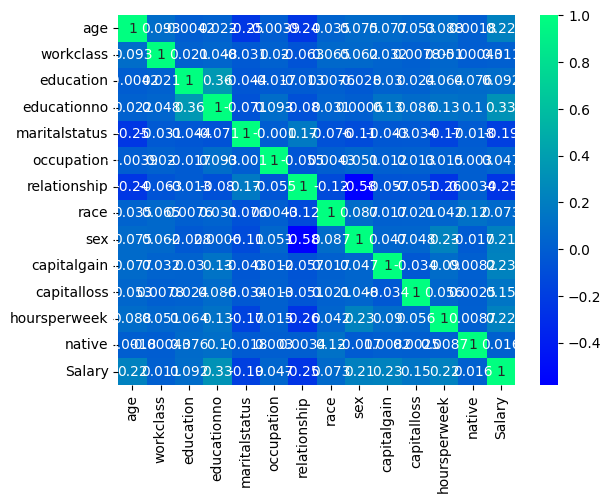

In [46]:
sns.heatmap(test.corr(),cmap='winter',annot=True)
plt.plot()

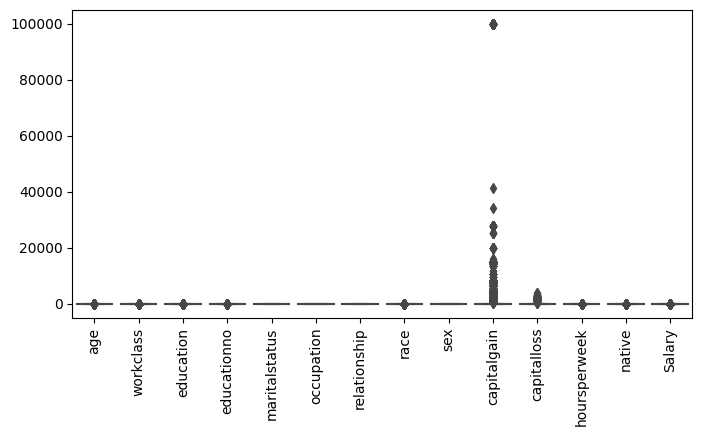

In [47]:
plt.figure(figsize=(8,4))
sns.boxplot(data=test)
plt.xticks(rotation=90)
plt.show()

In [48]:
test['capitalgain']=scaler.fit_transform(test['capitalgain'].values.reshape(-1,1))
test['capitalloss']=scaler.fit_transform(test['capitalloss'].values.reshape(-1,1))

In [49]:
test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0.000000,0.0,40,37,0
1,38,2,11,9,2,4,0,4,1,0.000000,0.0,50,37,0
2,28,1,7,12,2,10,0,4,1,0.000000,0.0,40,37,1
3,44,2,15,10,2,6,0,2,1,0.076881,0.0,40,37,1
4,34,2,0,6,4,7,1,4,1,0.000000,0.0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,33,2,9,13,4,9,3,4,1,0.000000,0.0,40,37,0
14126,39,2,9,13,0,9,1,4,0,0.000000,0.0,36,37,0
14127,38,2,9,13,2,9,0,4,1,0.000000,0.0,50,37,0
14128,44,2,9,13,0,0,3,1,1,0.054551,0.0,40,37,0


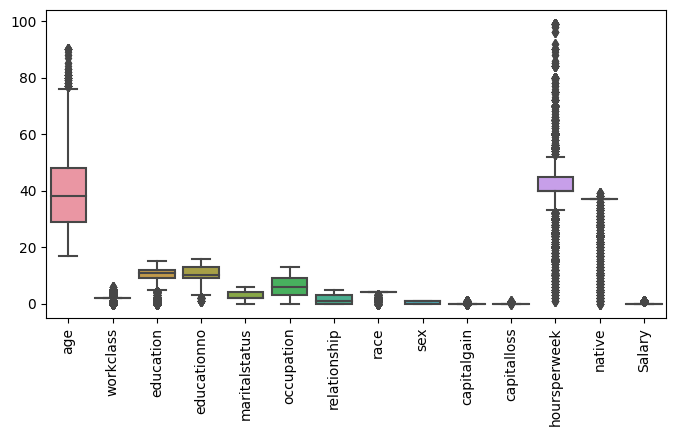

In [51]:
plt.figure(figsize=(8,4))
sns.boxplot(data=test)
plt.xticks(rotation=90)
plt.show()

In [52]:
test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0.000000,0.0,40,37,0
1,38,2,11,9,2,4,0,4,1,0.000000,0.0,50,37,0
2,28,1,7,12,2,10,0,4,1,0.000000,0.0,40,37,1
3,44,2,15,10,2,6,0,2,1,0.076881,0.0,40,37,1
4,34,2,0,6,4,7,1,4,1,0.000000,0.0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,33,2,9,13,4,9,3,4,1,0.000000,0.0,40,37,0
14126,39,2,9,13,0,9,1,4,0,0.000000,0.0,36,37,0
14127,38,2,9,13,2,9,0,4,1,0.000000,0.0,50,37,0
14128,44,2,9,13,0,0,3,1,1,0.054551,0.0,40,37,0


Data Visualization

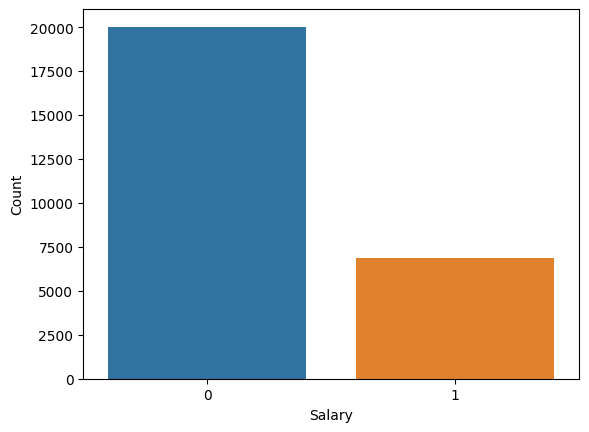

0    20023
1     6880
Name: Salary, dtype: int64

In [53]:
sns.countplot(x='Salary',data=train)
plt.xlabel('Salary')
plt.ylabel('Count')
plt.show()
train['Salary'].value_counts()

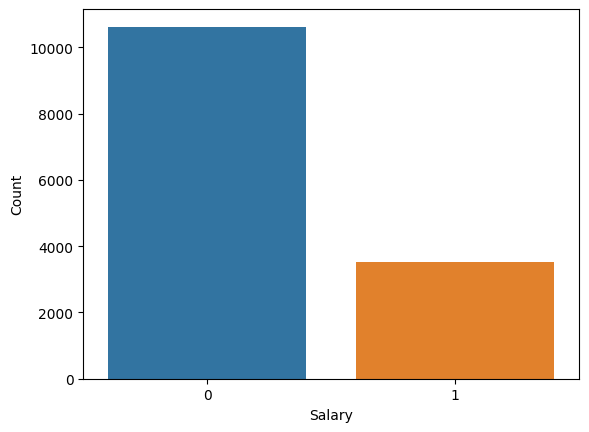

0    10620
1     3510
Name: Salary, dtype: int64

In [54]:
sns.countplot(x='Salary',data=test)
plt.xlabel('Salary')
plt.ylabel('Count')
plt.show()
test['Salary'].value_counts()

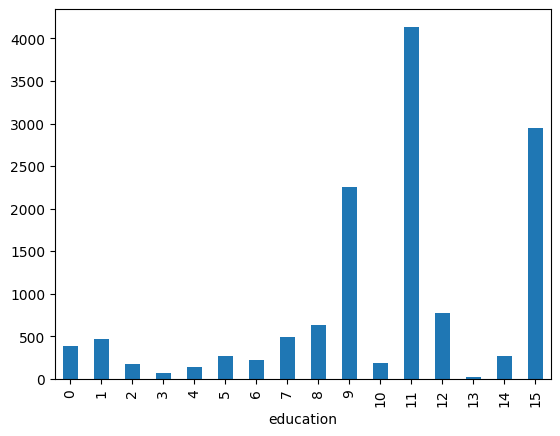

In [56]:
pd.crosstab(train['Salary'],train['education']).mean().plot(kind='bar')
plt.show()

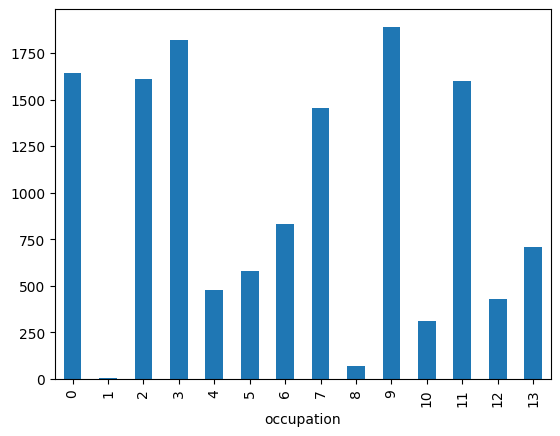

In [58]:
pd.crosstab(train['Salary'],train['occupation']).mean().plot(kind='bar')
plt.show()

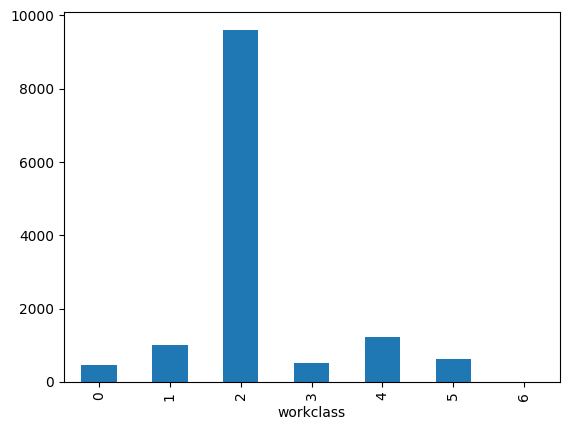

In [59]:
pd.crosstab(train['Salary'],train['workclass']).mean().plot(kind='bar')
plt.show()

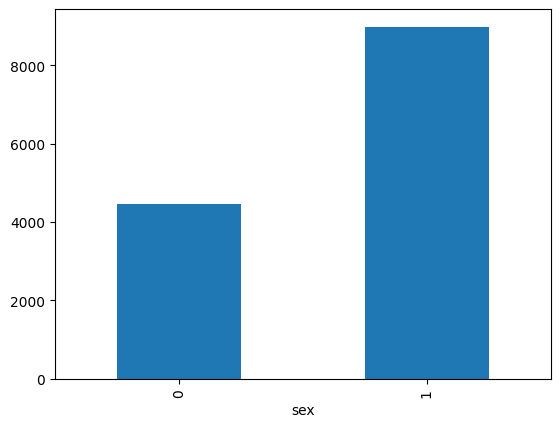

In [60]:
pd.crosstab(train['Salary'],train['sex']).mean().plot(kind='bar')
plt.show()

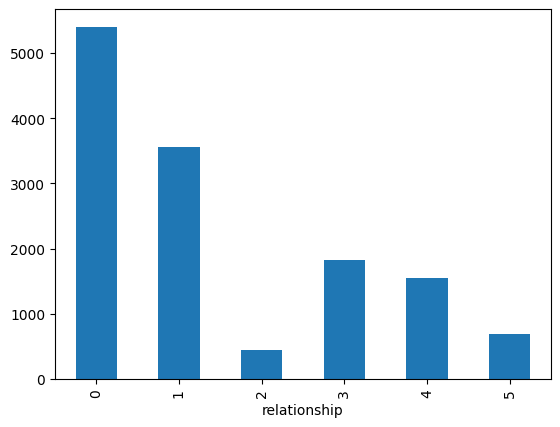

In [61]:
pd.crosstab(train['Salary'],train['relationship']).mean().plot(kind='bar')
plt.show()

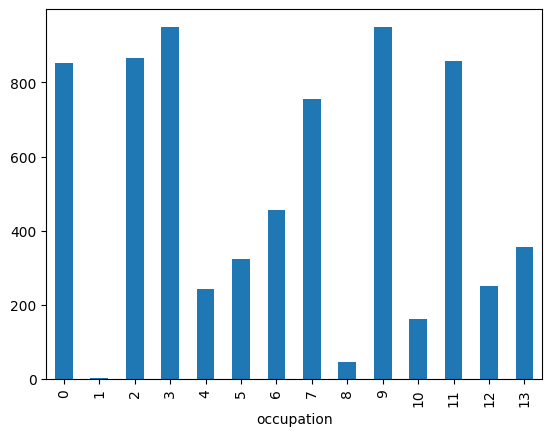

In [62]:
pd.crosstab(test['Salary'],test['occupation']).mean().plot(kind='bar')
plt.show()

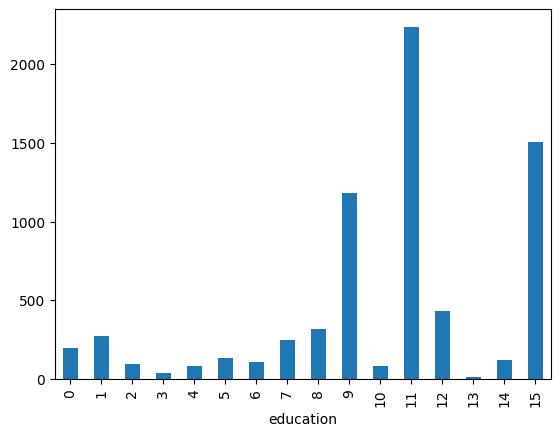

In [63]:
pd.crosstab(test['Salary'],test['education']).mean().plot(kind='bar')
plt.show()

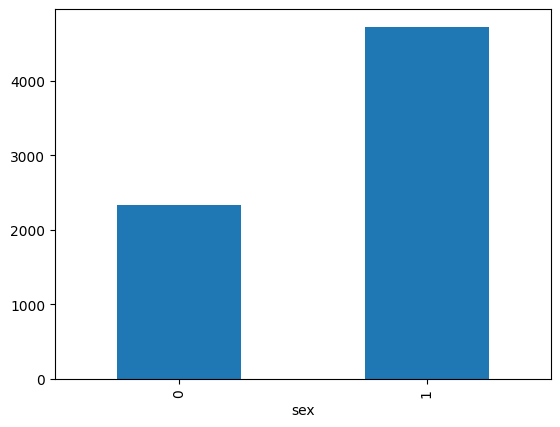

In [64]:
pd.crosstab(test['Salary'],test['sex']).mean().plot(kind='bar')
plt.show()

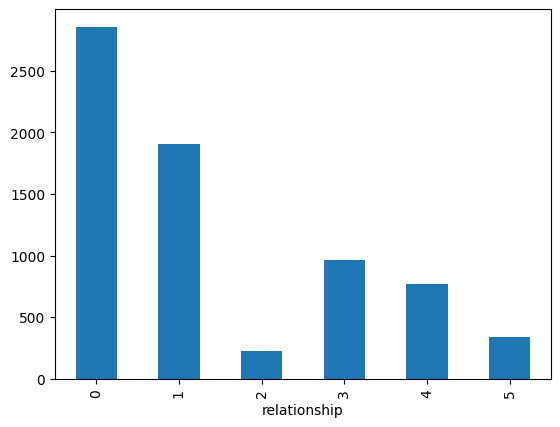

In [65]:
pd.crosstab(test['Salary'],test['relationship']).mean().plot(kind='bar')
plt.show()

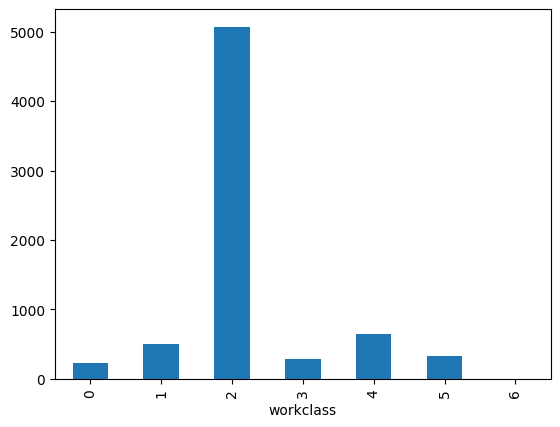

In [66]:
pd.crosstab(test['Salary'],test['workclass']).mean().plot(kind='bar')
plt.show()

In [67]:
from sklearn.decomposition import PCA

In [68]:
pca=PCA(n_components=13)
train_pca_values=pca.fit_transform(train)
train_pca_values

array([[-4.86462188e-01, -1.02588796e+00, -1.81467608e+00, ...,
        -1.46105714e-01, -3.96508742e-01, -2.03374823e-02],
       [-1.45540192e+00, -3.00775675e+01, -2.13486520e+00, ...,
        -2.22945629e-01, -3.74073254e-01, -1.93847323e-02],
       [-1.33216593e+00, -6.14065727e-01, -1.79991162e+00, ...,
        -1.01346093e-01, -3.43907205e-01, -1.47064914e-02],
       ...,
       [-1.23503851e+01,  2.07679934e+00, -1.74687466e+00, ...,
        -1.88814555e-01, -3.93985352e-02, -9.64735175e-03],
       [ 1.65467728e+01, -9.00575516e+00, -1.62026410e+00, ...,
        -1.37046038e-01,  3.98778557e-02, -1.16586630e-02],
       [ 1.12025614e+01, -6.48982537e+00, -1.69820241e+00, ...,
         7.26178563e-01,  5.10214760e-01, -5.58991284e-02]])

In [69]:
train_var=pca.explained_variance_ratio_
train_var

array([4.37380343e-01, 3.58876422e-01, 9.63081498e-02, 3.97619167e-02,
       3.88302422e-02, 1.29084190e-02, 6.02391965e-03, 5.00575744e-03,
       2.39939297e-03, 1.77138395e-03, 3.89877851e-04, 3.07621615e-04,
       2.28100467e-05])

In [70]:
np.cumsum(train_var)

array([0.43738034, 0.79625676, 0.89256491, 0.93232683, 0.97115707,
       0.98406549, 0.99008941, 0.99509517, 0.99749456, 0.99926595,
       0.99965582, 0.99996345, 0.99998626])

In [71]:
pca1=PCA(n_components=13)
test_pca_values=pca1.fit_transform(test)
test_pca_values

array([[-1.36796119e+01,  4.08693584e+00, -5.93002245e-01, ...,
         3.92410155e-01, -3.82015460e-01, -9.90831210e-03],
       [ 2.38996508e+00,  8.70111546e+00, -1.52622046e+00, ...,
        -2.19282073e-01, -2.12579162e-01, -1.65012369e-02],
       [-1.06270191e+01,  3.31101465e+00, -1.49236738e+00, ...,
         5.02804745e-01,  3.07437953e-01, -4.84996981e-02],
       ...,
       [ 2.43256037e+00,  8.78865121e+00, -1.61823789e+00, ...,
        -3.79890412e-01, -3.59946453e-01, -2.32184144e-02],
       [ 4.11014475e+00, -2.83779686e+00, -1.63907998e+00, ...,
         1.20941063e-01, -7.53093727e-01, -2.54035844e-02],
       [ 3.47723311e+00,  1.91360982e+01, -1.48861482e+00, ...,
         3.88999559e-01,  2.70738583e-01, -5.30705978e-02]])

In [72]:
test_var=pca1.explained_variance_ratio_
test_var

array([4.52761387e-01, 3.51183025e-01, 8.95835777e-02, 3.94680240e-02,
       3.87138742e-02, 1.27219436e-02, 5.93348543e-03, 4.86561042e-03,
       2.36921548e-03, 1.66373849e-03, 3.82538969e-04, 3.10301522e-04,
       2.91912452e-05])

In [73]:
np.cumsum(test_var)

array([0.45276139, 0.80394441, 0.89352799, 0.93299601, 0.97170989,
       0.98443183, 0.99036532, 0.99523093, 0.99760014, 0.99926388,
       0.99964642, 0.99995672, 0.99998591])

In [74]:
train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,0.021740,0.0,40,37,0
1,50,4,9,13,2,3,0,4,1,0.000000,0.0,13,37,0
2,38,2,11,9,0,5,1,4,1,0.000000,0.0,40,37,0
3,53,2,1,7,2,5,0,2,1,0.000000,0.0,40,37,0
4,28,2,9,13,2,9,5,2,0,0.000000,0.0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,53,2,12,14,2,3,0,4,1,0.000000,0.0,40,37,1
26899,22,2,15,10,4,10,1,4,1,0.000000,0.0,40,37,0
26900,27,2,7,12,2,12,5,4,0,0.000000,0.0,38,37,0
26901,58,2,11,9,6,0,4,4,0,0.000000,0.0,40,37,0


In [76]:
ntrain=pd.DataFrame(data=train_pca_values,columns=['PCA_comps1','PCA_comps2','PCA_comps3','PCA_comps4','PCA_comps5','PCA_comps6','PCA_comps7','PCA_comps8','PCA_comps9','PCA_comps10','PCA_comps11','PCA_comps12','PCA_comps13'])
ntrain

,PCA_comps1,PCA_comps2,PCA_comps3,PCA_comps4,PCA_comps5,PCA_comps6,PCA_comps7,PCA_comps8,PCA_comps9,PCA_comps10,PCA_comps11,PCA_comps12,PCA_comps13
0,-0.486462,-1.025888,-1.814676,-5.329081,2.101674,-3.621898,0.073424,-1.671808,2.771981,0.030557,-0.146106,-0.396509,-0.020337
1,-1.455402,-30.077568,-2.134865,-2.432120,0.273837,-4.034436,-2.125646,-0.236255,1.698634,0.030462,-0.222946,-0.374073,-0.019385
2,-1.332166,-0.614066,-1.799912,-1.170457,0.173622,1.152817,-1.725285,2.093421,-0.199623,-0.211136,-0.101346,-0.343907,-0.014706
3,12.162676,-7.051706,-0.733353,2.155623,9.675370,-0.310162,-1.043503,-0.219659,-0.511753,1.760248,-0.142965,-0.197344,-0.013286
4,-10.904537,3.300764,30.941377,2.205414,-3.733577,-3.457452,2.931789,2.424420,-0.078362,0.903261,-0.200695,-0.079284,-0.003086
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,12.397738,-6.652955,-2.046290,-3.460711,-1.826572,-3.265829,-0.974918,-0.381278,-0.361228,-0.244472,0.430027,0.091598,-0.046808
26899,-15.966852,6.106073,-2.272378,2.270370,-5.215281,2.016834,-0.511595,-1.267632,-0.142107,-0.368639,0.002164,-0.255299,-0.014334
26900,-12.350385,2.076799,-1.746875,6.537535,0.449419,-2.245076,2.742631,2.365463,0.071671,-0.542940,-0.188815,-0.039399,-0.009647
26901,16.546773,-9.005755,-1.620264,-5.895546,1.843332,1.207504,4.229496,-2.368789,-0.051106,-0.692813,-0.137046,0.039878,-0.011659


In [77]:
ntest=pd.DataFrame(data=test_pca_values,columns=['PCA_comps1','PCA_comps2','PCA_comps3','PCA_comps4','PCA_comps5','PCA_comps6','PCA_comps7','PCA_comps8','PCA_comps9','PCA_comps10','PCA_comps11','PCA_comps12','PCA_comps13'])
ntest

,PCA_comps1,PCA_comps2,PCA_comps3,PCA_comps4,PCA_comps5,PCA_comps6,PCA_comps7,PCA_comps8,PCA_comps9,PCA_comps10,PCA_comps11,PCA_comps12,PCA_comps13
0,-13.679612,4.086936,-0.593002,-1.777690,9.707923,-0.159927,1.489836,-0.149972,-0.262565,1.503355,0.392410,-0.382015,-0.009908
1,2.389965,8.701115,-1.526220,-2.200882,-0.281299,1.259591,-1.390796,-0.265094,-0.228298,-0.203414,-0.219282,-0.212579,-0.016501
2,-10.627019,3.311015,-1.492367,3.719719,3.204964,-2.651865,-1.781908,-0.060359,-1.221473,-0.348204,0.502805,0.307438,-0.048500
3,4.168685,-2.691708,-2.021730,0.569423,-4.285656,1.676522,-1.333962,-0.352146,-0.598140,1.728203,0.640807,0.331151,-0.052903
4,-9.110689,-8.583799,-0.579177,-0.871424,10.816755,0.241220,-0.421049,-1.263452,-0.071410,-0.319332,0.128786,-0.167733,-0.010002
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,-6.159826,1.394457,-1.717822,3.059705,0.894498,-2.694698,1.976837,-0.326550,-0.101222,-0.497414,0.147725,-0.662355,-0.022677
14126,-1.945756,-4.532047,-1.775895,3.179770,0.693187,-2.986567,-1.526948,2.075254,-0.239875,-0.187794,-0.805366,0.289461,-0.016952
14127,2.432560,8.788651,-1.618238,3.010675,1.152824,-2.685014,-1.007065,-0.195547,-0.301726,-0.202828,-0.379890,-0.359946,-0.023218
14128,4.110145,-2.837797,-1.639080,-5.742495,-0.740911,-3.575188,0.429636,2.887858,-0.601753,2.616321,0.120941,-0.753094,-0.025404


In [78]:
ntrain=ntrain.iloc[:,:7]
ntest=ntest.iloc[:,:7]

In [79]:
ntrain['Salary']=train['Salary']
ntest['Salary']=test['Salary']
ntrain

<ipython-input-79-8ac0906af2c6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ntrain['Salary']=train['Salary']
<ipython-input-79-8ac0906af2c6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ntest['Salary']=test['Salary']


,PCA_comps1,PCA_comps2,PCA_comps3,PCA_comps4,PCA_comps5,PCA_comps6,PCA_comps7,Salary
0,-0.486462,-1.025888,-1.814676,-5.329081,2.101674,-3.621898,0.073424,0
1,-1.455402,-30.077568,-2.134865,-2.432120,0.273837,-4.034436,-2.125646,0
2,-1.332166,-0.614066,-1.799912,-1.170457,0.173622,1.152817,-1.725285,0
3,12.162676,-7.051706,-0.733353,2.155623,9.675370,-0.310162,-1.043503,0
4,-10.904537,3.300764,30.941377,2.205414,-3.733577,-3.457452,2.931789,0
...,...,...,...,...,...,...,...,...
26898,12.397738,-6.652955,-2.046290,-3.460711,-1.826572,-3.265829,-0.974918,1
26899,-15.966852,6.106073,-2.272378,2.270370,-5.215281,2.016834,-0.511595,0
26900,-12.350385,2.076799,-1.746875,6.537535,0.449419,-2.245076,2.742631,0
26901,16.546773,-9.005755,-1.620264,-5.895546,1.843332,1.207504,4.229496,0


In [107]:
tr_X=ntrain.iloc[:,:7]
tr_y=ntrain.iloc[:,7]
te_X=ntrain.iloc[:,:7]
te_y=ntrain.iloc[:,7]

In [88]:
X_train=ntrain.iloc[:,:7]
y_train=train.iloc[:,13]
X_test=ntest.iloc[:,:7]
y_test=test.iloc[:,13]

Model Building

In [89]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,roc_curve

In [90]:
model=SVC(C=0.5,gamma=0.01,kernel='rbf')


In [91]:
model.fit(X_train,y_train)

SVC(C=0.5, gamma=0.01)

In [92]:
train_pred=model.predict(X_train)

In [94]:
confusion_matrix(y_train,train_pred)

array([[18911,  1112],
       [ 4245,  2635]])

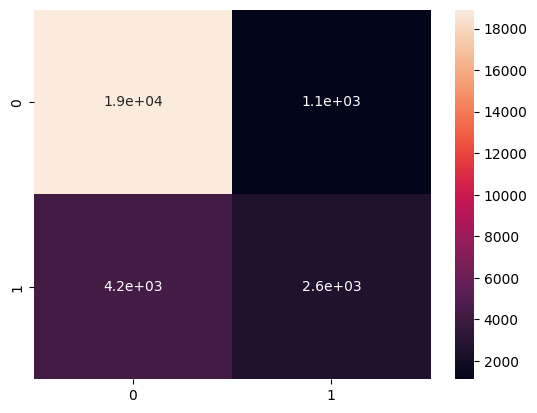

In [95]:
sns.heatmap(confusion_matrix(y_train,train_pred),annot=True)
plt.show()

In [96]:
print(classification_report(y_train,train_pred))

              precision    recall  f1-score   support

           0       0.82      0.94      0.88     20023
           1       0.70      0.38      0.50      6880

    accuracy                           0.80     26903
   macro avg       0.76      0.66      0.69     26903
weighted avg       0.79      0.80      0.78     26903



In [97]:
test_pred=model.predict(X_test)


In [99]:
confusion_matrix(y_test,test_pred)

array([[10006,   614],
       [ 2253,  1257]])

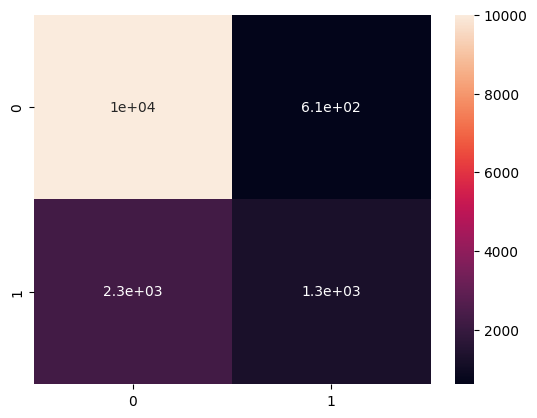

In [100]:
sns.heatmap(confusion_matrix(y_test,test_pred),annot=True)
plt.show()

In [101]:
print(classification_report(y_test,test_pred))

              precision    recall  f1-score   support

           0       0.82      0.94      0.87     10620
           1       0.67      0.36      0.47      3510

    accuracy                           0.80     14130
   macro avg       0.74      0.65      0.67     14130
weighted avg       0.78      0.80      0.77     14130



In [102]:
from imblearn.over_sampling import SMOTE

In [103]:
smote=SMOTE(sampling_strategy='auto')


In [108]:
tr_X,tr_y=smote.fit_resample(tr_X,tr_y)

In [109]:
te_X,te_y=smote.fit_resample(te_X,te_y)

In [110]:
model.fit(tr_X,tr_y)

SVC(C=0.5, gamma=0.01)

In [111]:
train_pred1=model.predict(tr_X)

In [113]:
confusion_matrix(tr_y,train_pred1)

array([[14391,  5632],
       [ 3035, 16988]])

In [115]:
print(classification_report(tr_y,train_pred1))

              precision    recall  f1-score   support

           0       0.83      0.72      0.77     20023
           1       0.75      0.85      0.80     20023

    accuracy                           0.78     40046
   macro avg       0.79      0.78      0.78     40046
weighted avg       0.79      0.78      0.78     40046



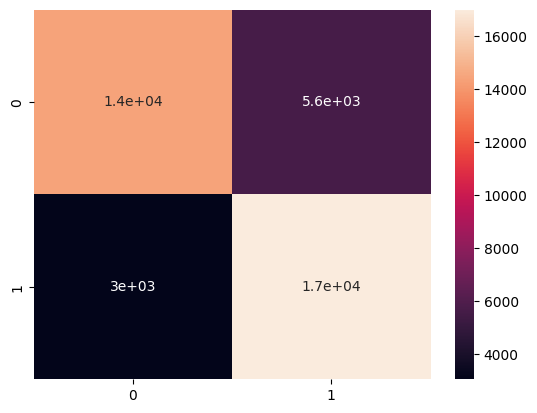

In [117]:
sns.heatmap(confusion_matrix(tr_y,train_pred1),annot=True)
plt.show()

In [118]:
model=SVC(probability=True)
model.fit(tr_X,tr_y)
train_proba=model.predict_proba(tr_X)

In [119]:
train_proba[:,1]

array([0.52336881, 0.27863912, 0.58258212, ..., 0.75837109, 0.78923129,
       0.30602293])

In [120]:
fpr,tpr,thresh=roc_curve(tr_y,train_proba[:,1])

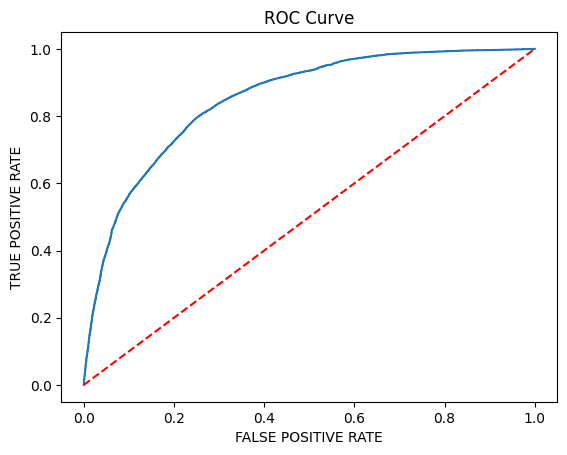

In [122]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.show()

In [123]:
test_pred1=model.predict(te_X)

In [124]:
  confusion_matrix(te_y,test_pred1)

array([[14099,  5924],
       [ 3335, 16688]])

In [125]:
print(classification_report(te_y,test_pred1))

              precision    recall  f1-score   support

           0       0.81      0.70      0.75     20023
           1       0.74      0.83      0.78     20023

    accuracy                           0.77     40046
   macro avg       0.77      0.77      0.77     40046
weighted avg       0.77      0.77      0.77     40046



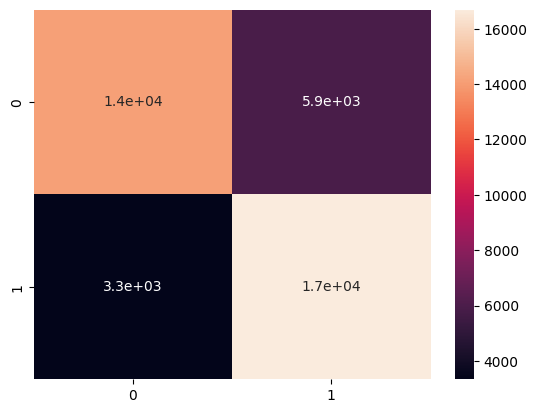

In [126]:
sns.heatmap( confusion_matrix(te_y,test_pred1),annot=True)
plt.show()

In [127]:
model=SVC(probability=True)
model.fit(te_X,te_y)
test_proba=model.predict_proba(te_X)


In [128]:
test_proba[:,1]

array([0.55474996, 0.2817    , 0.58263146, ..., 0.78402702, 0.33562458,
       0.6751972 ])

In [129]:
fpr1,tpr1,thresh=roc_curve(te_y,test_proba[:,1])

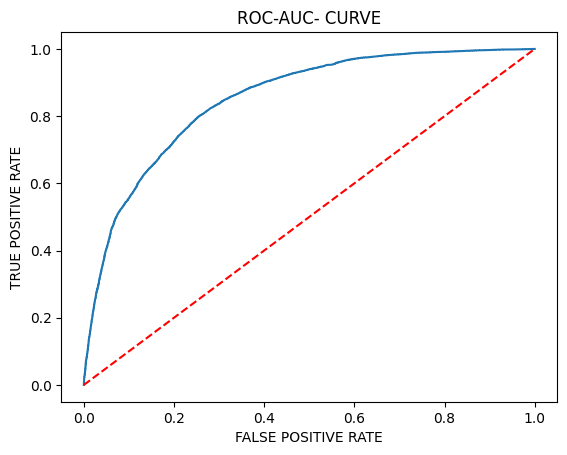

In [130]:
plt.plot(fpr1,tpr1)
plt.plot([0,1],[0,1],'r--')
plt.title('ROC-AUC- CURVE')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.show()

In [131]:
from sklearn.manifold import TSNE

In [132]:
tsne=TSNE(n_components=2)

In [133]:
tsne_comp=tsne.fit_transform(tr_X)

In [134]:
tsne_comp

array([[ -35.904037,   -5.591387],
       [ -25.953224, -101.703835],
       [ -86.60979 ,  -34.631508],
       ...,
       [  43.442657,   64.05481 ],
       [  -4.563619,   60.08351 ],
       [ -42.94861 ,  -95.39009 ]], dtype=float32)

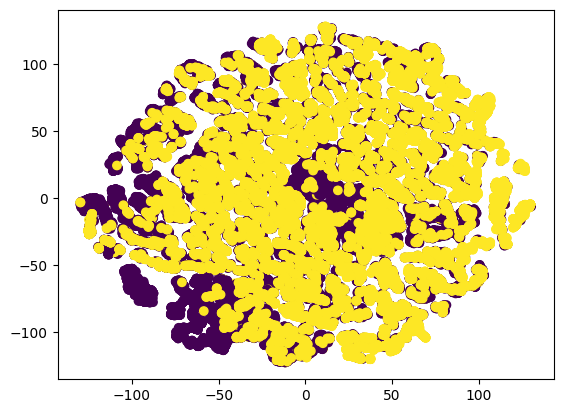

In [140]:
plt.scatter(tsne_comp[:,0],tsne_comp[:,1],c=tr_y,cmap='viridis')
plt.show()

In [137]:
tsne_comp1=tsne.fit_transform(te_X)

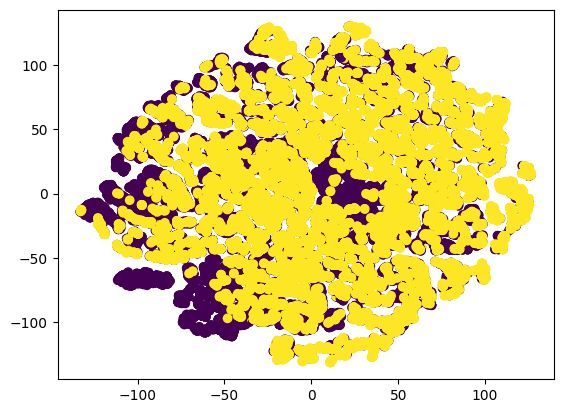

In [139]:
plt.scatter(tsne_comp1[:,0],tsne_comp1[:,1],c=te_y,cmap='viridis')
plt.show()